In [1]:
from __future__ import print_function, division

import thinkdsp
import thinkplot
import numpy as np
import pandas as pd
np.set_printoptions(threshold=np.nan)

from IPython.display import display

%matplotlib inline

<h1><center>Preprocessing</center></h1>

In [2]:
CUTOFF_FREQ = 3000

___
## Good samples

In [3]:
good = thinkdsp.read_wave(filename='good.wav')
good.make_audio()

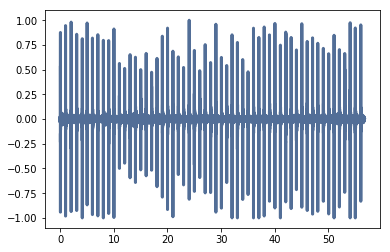

In [4]:
good.plot()


Filtering

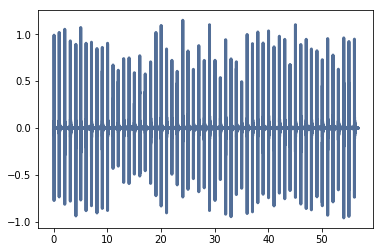

In [58]:
spec_good = good.make_spectrum()
spec_good.high_pass(cutoff=CUTOFF_FREQ)
filtered_good = spec_good.make_wave()
filtered_good.plot()

In [6]:
filtered_good.make_audio()

#### Separate the full audio in separate segments

In [56]:
end = max(good.ts)
window_start = 0
duration = 0.2
jump = 1
good_segments1 = []

while window_start <= end:
    segment = good.segment(start=window_start, duration=duration)
    good_segments1.append(segment)
    window_start += jump

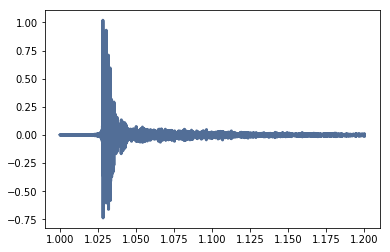

In [57]:
good_segments[1].plot()

In [59]:
good = filtered_good
end = max(good.ts)
window_start = 0
duration = 0.2
jump = 1
good_segments = []

while window_start <= end:
    segment = good.segment(start=window_start, duration=duration)
    good_segments.append(segment)
    window_start += jump

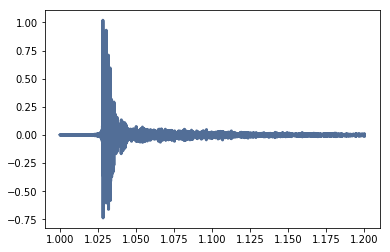

In [60]:
good_segments[1].plot()

In [9]:
good_segments[6].make_audio()

#### Iterate trought segments

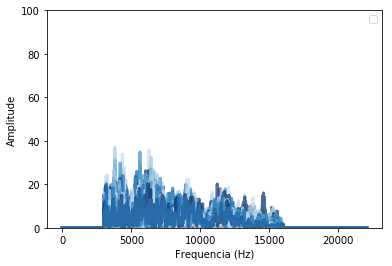

In [78]:
good_spectrums = []
good_slopes = []
good_spec_amps = []
for idx, segment in enumerate(good_segments):
    good_spectrums.append(segment.make_spectrum()) # get spectrums
    good_slopes.append(good_spectrums[idx].estimate_slope()) # get slopes
    good_spec_amps.append(good_spectrums[idx].amps) # get amplitudes
    
    good_spectrums[idx].plot()
    thinkplot.config(xlabel='Frequencia (Hz)', ylabel='Amplitude', ylim=(0,100))
    

### Slopes Dataframe

In [18]:
good_slopes_df = pd.DataFrame(good_slopes)
good_slopes_df['label']=1
good_slopes_df

,slope,intercept,rvalue,pvalue,stderr,label
0,-0.039757,-2.392910,-0.007649,6.115804e-01,0.078284,1
1,0.760590,-9.170689,0.130985,2.467300e-18,0.086707,1
2,0.834448,-10.575155,0.141792,3.043227e-21,0.087744,1
3,0.619917,-7.665881,0.114262,2.726828e-14,0.081182,1
4,1.194065,-12.030527,0.286468,4.573639e-84,0.060150,1
5,0.104283,-3.422622,0.018821,2.114503e-01,0.083442,1
6,0.868489,-10.378004,0.142650,1.746405e-21,0.090762,1
7,0.328408,-5.721699,0.058041,1.150003e-04,0.085079,1
8,0.204740,-3.720856,0.039264,9.115399e-03,0.078479,1
9,0.163115,-3.941182,0.030304,4.418828e-02,0.081036,1


___
## Bad samples

In [19]:
bad = thinkdsp.read_wave(filename='bad.wav')
bad.make_audio()

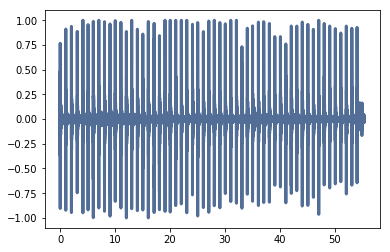

In [20]:
bad.plot()

Filtering

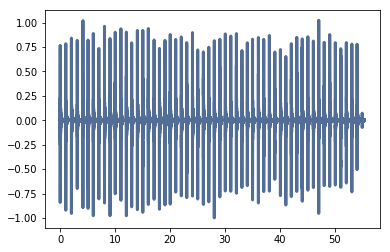

In [21]:
spec_bad = bad.make_spectrum()
spec_bad.high_pass(cutoff=CUTOFF_FREQ)
filtered_bad = spec_bad.make_wave()
filtered_bad.plot()

#### Separate the wave in segments

In [22]:
bad = filtered_bad
end = max(bad.ts)
window_start = 0
duration = 0.2
jump = 1
bad_segments = []

while window_start <= end:
    segment = bad.segment(start=window_start, duration=duration)
    bad_segments.append(segment)
    window_start += jump

#### Iterate trought segments

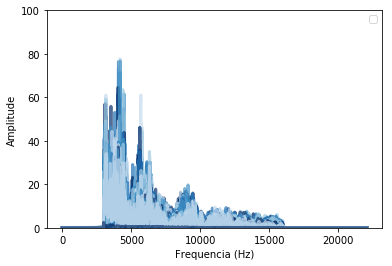

In [77]:
bad_spectrums = []
bad_slopes = []
bad_spec_amps = []
for idx, segment in enumerate(bad_segments):
    bad_spectrums.append(segment.make_spectrum()) # get spectrums
    bad_slopes.append(bad_spectrums[idx].estimate_slope()) # get slopes
    bad_spec_amps.append(bad_spectrums[idx].amps) # get amplitudes
    
    bad_spectrums[idx].plot()
    thinkplot.config(xlabel='Frequencia (Hz)', ylabel='Amplitude', ylim=(0,100))
    

### Slopes Dataframe

In [24]:
bad_slopes_df = pd.DataFrame(bad_slopes)
bad_slopes_df['label']=0
bad_slopes_df

,slope,intercept,rvalue,pvalue,stderr,label
0,-0.623956,3.555606,-0.113451,4.146655e-14,0.082302,0
1,-0.760520,4.871602,-0.140321,7.814968e-21,0.080826,0
2,-1.101390,7.884729,-0.214966,2.875485e-47,0.075366,0
3,0.778788,-9.058964,0.140755,5.922862e-21,0.082507,0
4,-1.528320,11.832776,-0.321422,1.559561e-106,0.067817,0
5,-0.669516,3.371622,-0.125038,7.822914e-17,0.080016,0
6,-0.125402,-1.177055,-0.022823,1.296669e-01,0.082736,0
7,0.050303,-2.001243,0.010218,4.975124e-01,0.074142,0
8,-0.851990,5.671661,-0.170083,5.593556e-30,0.074349,0
9,0.993548,-12.292618,0.157362,7.550253e-26,0.093912,0


<h1><center>Join good and bad samples</center></h1>

### Slopes

Slopes: é uma medida da rapidez com que o espectro de um som de áudio cai para as altas frequências, calculado usando uma regressão linear. <br>
pvalue: A probabilidade de se obter o mesmo valor se rodar o experimento várias vezes. <br>
intercept: <br>
rvalue: <br>
stderr: <br>


In [25]:
slopes_df = pd.concat([bad_slopes_df,good_slopes_df])
slopes_df = slopes_df.reset_index()
slopes_df.drop('index', inplace=True, axis=1)
slopes_df

,slope,intercept,rvalue,pvalue,stderr,label
0,-0.623956,3.555606,-0.113451,4.146655e-14,0.082302,0
1,-0.760520,4.871602,-0.140321,7.814968e-21,0.080826,0
2,-1.101390,7.884729,-0.214966,2.875485e-47,0.075366,0
3,0.778788,-9.058964,0.140755,5.922862e-21,0.082507,0
4,-1.528320,11.832776,-0.321422,1.559561e-106,0.067817,0
5,-0.669516,3.371622,-0.125038,7.822914e-17,0.080016,0
6,-0.125402,-1.177055,-0.022823,1.296669e-01,0.082736,0
7,0.050303,-2.001243,0.010218,4.975124e-01,0.074142,0
8,-0.851990,5.671661,-0.170083,5.593556e-30,0.074349,0
9,0.993548,-12.292618,0.157362,7.550253e-26,0.093912,0


<h1><center>Apply classification</center></h1>

## Decision tree

In [26]:
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import classification_report,confusion_matrix

from IPython.display import Image

import pydotplus

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [27]:
df = slopes_df
X = df.drop(['label'], axis=1)
y = df.label

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

#### Cross validation

In [61]:
#Verify the best depth of the tree using grid search
parameters = {'max_depth':range(3,20)}
dtree = DecisionTreeClassifier()
clf = GridSearchCV(dtree, parameters)
clf.fit(X=X_train, y=y_train)

dtree = clf.best_estimator_

print (clf.best_score_, clf.best_params_) 

0.8354430379746836 {'max_depth': 5}


In [62]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [69]:
scores = cross_val_score(dtree, X_train, y_train, cv=5)
scores   

array([0.76470588, 0.75      , 0.75      , 0.8       , 0.86666667])

In [70]:
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.79 (+/- 0.09)


In [71]:
dtree.classes_

array([0, 1])

In [34]:
predictions = dtree.predict(X_test)

In [35]:
print(classification_report(y_test,predictions))

             precision    recall  f1-score   support

          0       0.73      0.53      0.62        15
          1       0.70      0.84      0.76        19

avg / total       0.71      0.71      0.70        34



In [36]:
print(confusion_matrix(y_test,predictions))

[[ 8  7]
 [ 3 16]]


#### Data visualization

In [37]:
dot_data = StringIO()

In [38]:
df.columns[:6]

Index([u'slope', u'intercept', u'rvalue', u'pvalue', u'stderr', u'label'], dtype='object')

In [39]:
features = list(df.columns[:5])

In [40]:
export_graphviz(dtree, out_file=dot_data,feature_names=features,  
                filled=True, rounded=True,special_characters=True)

In [41]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
graph

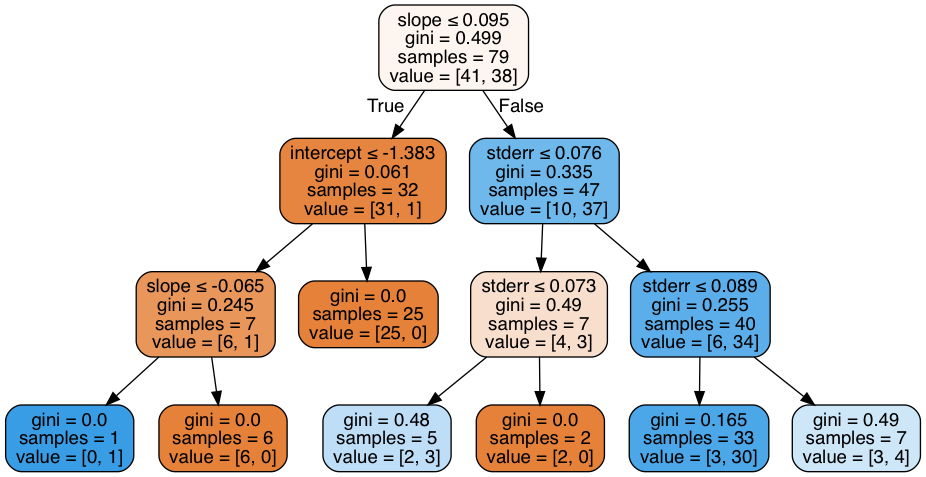

In [42]:
Image(graph.create_png())

# Save model

In [52]:
from sklearn.externals import joblib
joblib.dump(dtree, 'model.pkl') 

['model.pkl']

# End of code

## Plot spectrums

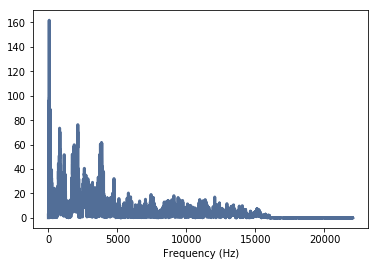

In [208]:
bad_spectrums[0].plot()
thinkplot.config(xlabel='Frequency (Hz)')

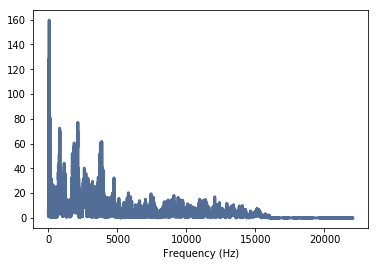

In [209]:
bad_spectrums[1].plot()
thinkplot.config(xlabel='Frequency (Hz)')

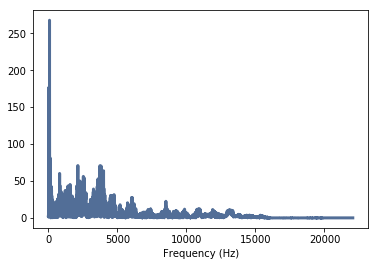

In [210]:
bad_spectrums[2].plot()
thinkplot.config(xlabel='Frequency (Hz)')

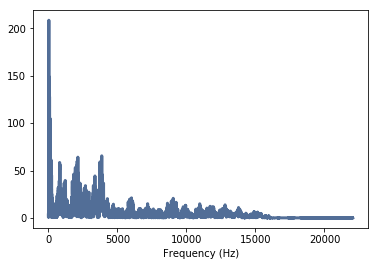

In [211]:
bad_spectrums[3].plot()
thinkplot.config(xlabel='Frequency (Hz)')

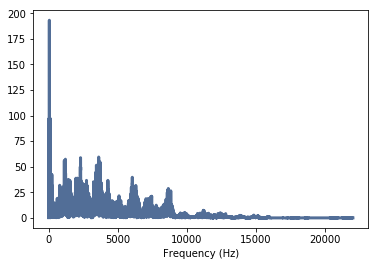

In [212]:
bad_spectrums[4].plot()
thinkplot.config(xlabel='Frequency (Hz)')

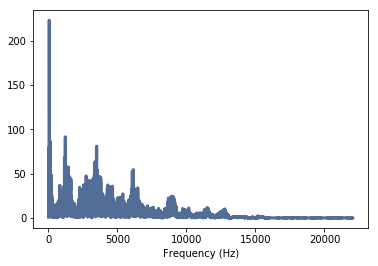

In [213]:
bad_spectrums[5].plot()
thinkplot.config(xlabel='Frequency (Hz)')

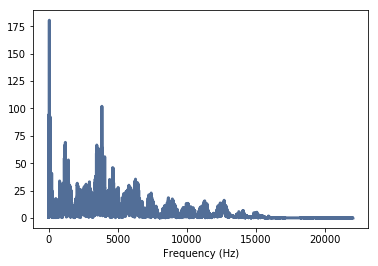

In [214]:
bad_spectrums[6].plot()
thinkplot.config(xlabel='Frequency (Hz)')

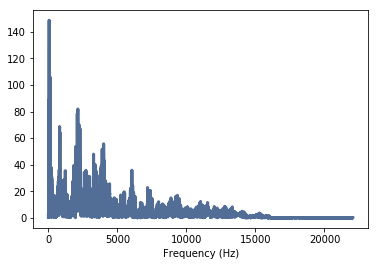

In [215]:
bad_spectrums[7].plot()
thinkplot.config(xlabel='Frequency (Hz)')

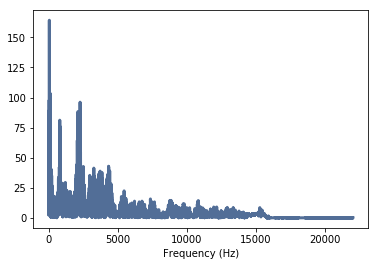

In [216]:
bad_spectrums[8].plot()
thinkplot.config(xlabel='Frequency (Hz)')

# Bkp

In [28]:
window = np.hamming(len(good))
good.window(window)

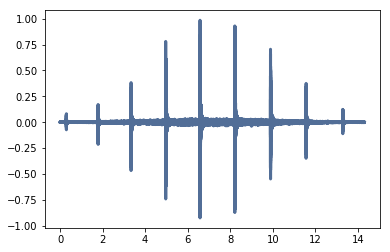

In [29]:
good.plot()

In [269]:
arr = []
for y in good_segments[0].ys:
    if (y>0.1) or (y<-0.1):
        arr.append(True)
    else: 
        arr.append(False)
    

## Random Forest

In [271]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

clf = RandomForestClassifier(max_depth=10, random_state=0)
clf.fit(X_train, y_train)
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=2, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=0, verbose=0, warm_start=False)
print(clf.feature_importances_)
predictions = clf.predict(X_test)
# print(clf.transform(X_test))

[ 0.20922619  0.21761364  0.44464286  0.          0.12851732]


In [272]:
print(classification_report(y_test,predictions))

             precision    recall  f1-score   support

          0       0.67      0.67      0.67         3
          1       0.67      0.67      0.67         3

avg / total       0.67      0.67      0.67         6



In [273]:
print(confusion_matrix(y_test,predictions))

[[2 1]
 [1 2]]


In [ ]:
        self.hs = np.asanyarray(hs)
        self.fs = np.asanyarray(fs)
        self.framerate = framerate
        self.full = full